<a href="https://colab.research.google.com/github/sailesh-b/Bayesian-Network-Based-Weather-Forecasting-Application/blob/main/weather.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# @title
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', 50)
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
import plotly
import plotly.express as px
import plotly.graph_objects as go
!pip install phik
import phik
import warnings
warnings.filterwarnings('ignore')

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 8.2 MB/s eta 0:00:00


In [ ]:
df = pd.read_csv('IndianWeatherRepository 8.3.24.csv')

In [ ]:
num_cols = df.dtypes[df.dtypes != 'object'].index
print('Numeric Columns are:\n', list(num_cols))
print("\n*"*3, '\n')
obj_cols = df.dtypes[df.dtypes == 'object'].index
print('Object columns are:\n', list(obj_cols))

Numeric Columns are:
 ['latitude', 'longitude', 'last_updated_epoch', 'temperature_celsius', 'temperature_fahrenheit', 'wind_mph', 'wind_kph', 'wind_degree', 'pressure_mb', 'pressure_in', 'precip_mm', 'precip_in', 'humidity', 'cloud', 'feels_like_celsius', 'feels_like_fahrenheit', 'visibility_km', 'visibility_miles', 'uv_index', 'gust_mph', 'gust_kph', 'air_quality_Carbon_Monoxide', 'air_quality_Ozone', 'air_quality_Nitrogen_dioxide', 'air_quality_Sulphur_dioxide', 'air_quality_PM2.5', 'air_quality_PM10', 'air_quality_us-epa-index', 'air_quality_gb-defra-index', 'moon_illumination']

*
*
* 

Object columns are:
 ['country', 'location_name', 'region', 'timezone', 'last_updated', 'condition_text', 'wind_direction', 'sunrise', 'sunset', 'moonrise', 'moonset', 'moon_phase']


In [ ]:
df.head()

,country,location_name,region,latitude,longitude,timezone,last_updated_epoch,last_updated,temperature_celsius,temperature_fahrenheit,condition_text,wind_mph,wind_kph,wind_degree,wind_direction,pressure_mb,pressure_in,precip_mm,precip_in,humidity,cloud,feels_like_celsius,feels_like_fahrenheit,visibility_km,visibility_miles,uv_index,gust_mph,gust_kph,air_quality_Carbon_Monoxide,air_quality_Ozone,air_quality_Nitrogen_dioxide,air_quality_Sulphur_dioxide,air_quality_PM2.5,air_quality_PM10,air_quality_us-epa-index,air_quality_gb-defra-index,sunrise,sunset,moonrise,moonset,moon_phase,moon_illumination
0,India,Ashoknagar,Madhya Pradesh,24.57,77.72,Asia/Kolkata,1693286100,2023-08-29 10:45,27.5,81.5,Partly cloudy,12.8,20.5,281,WNW,1008.0,29.77,0.0,0.0,67,26,29.7,85.5,10.0,6.0,7.0,14.8,23.8,243.7,45.8,1.7,3.1,12.6,18.5,1,2,05:59 AM,06:41 PM,05:42 PM,03:38 AM,Waxing Gibbous,93
1,India,Raisen,Madhya Pradesh,23.33,77.80,Asia/Kolkata,1693286100,2023-08-29 10:45,27.5,81.5,Sunny,9.6,15.5,287,WNW,1008.0,29.78,0.0,0.0,70,19,30.0,86.0,10.0,6.0,7.0,11.2,18.0,240.3,38.3,2.1,2.6,10.7,14.2,1,1,06:00 AM,06:40 PM,05:39 PM,03:41 AM,Waxing Gibbous,93
2,India,Chhindwara,Madhya Pradesh,22.07,78.93,Asia/Kolkata,1693286100,2023-08-29 10:45,26.3,79.3,Partly cloudy,11.4,18.4,317,NW,1009.0,29.78,0.0,0.0,70,51,28.2,82.8,10.0,6.0,7.0,13.2,21.2,220.3,57.2,0.6,1.7,16.8,20.7,2,2,05:56 AM,06:34 PM,05:32 PM,03:39 AM,Waxing Gibbous,93
3,India,Betul,Madhya Pradesh,21.86,77.93,Asia/Kolkata,1693286100,2023-08-29 10:45,25.6,78.1,Cloudy,10.5,16.9,297,WNW,1009.0,29.80,0.0,0.0,76,65,27.6,81.7,10.0,6.0,6.0,13.0,20.9,200.3,25.0,1.2,1.1,4.9,6.6,1,1,06:00 AM,06:38 PM,05:36 PM,03:43 AM,Waxing Gibbous,93
4,India,Hoshangabad,Madhya Pradesh,22.75,77.72,Asia/Kolkata,1693286100,2023-08-29 10:45,27.2,81.0,Cloudy,10.1,16.2,274,W,1009.0,29.79,0.0,0.0,74,82,29.9,85.8,10.0,6.0,6.0,11.6,18.7,257.0,30.8,2.2,1.8,11.4,14.8,1,1,06:01 AM,06:39 PM,05:38 PM,03:42 AM,Waxing Gibbous,93


In [ ]:
df['country'].unique()

array(['India'], dtype=object)

In [ ]:
df.groupby('timezone').agg('count')


NameError: name 'df' is not defined

In [ ]:
df = df[df['timezone'] == 'Asia/Kolkata']


In [ ]:
all_states = df['region'].unique()
print(all_states, '\n')
print('*\n'*3)
print('Some states are missing, they are: ')


['Madhya Pradesh' 'Uttar Pradesh' 'Orissa' 'Rajasthan' 'Gujarat'
 'Himachal Pradesh' 'Chhattisgarh' 'Jammu and Kashmir' 'Daman and Diu'
 'Dadra and Nagar Haveli' 'Andhra Pradesh' 'Jharkhand' 'Bihar'
 'West Bengal' 'Maharashtra' 'Haryana' 'Chandigarh' 'Goa'
 'Andaman and Nicobar Islands' 'Arunachal Pradesh' 'Assam' 'Puducherry'
 'Kerala' 'Mizoram' 'Manipur' 'Nagaland' 'Tripura' 'Karnataka'
 'Uttarakhand' 'Lakshadweep' 'Punjab' 'Tamil Nadu' 'Delhi'] 

*
*
*

Some states are missing, they are: 


In [ ]:
df['last_updated'] = pd.to_datetime(df['last_updated'], format='%Y-%m-%d %H:%M:%S')


In [ ]:
from datetime import datetime, timedelta
import numpy as np

# Assuming df is your DataFrame with a 'last_updated' column

# Get unique dates from the 'last_updated' column
dates = df['last_updated'].unique()

# Print all unique dates
print(dates)

# Set the timedelta to 3 days
three_days_ago = np.datetime64(datetime.now() - timedelta(days=10))

# Filter dates that are newer than 3 days ago
newer_than_3_days = dates[dates > three_days_ago]

# Print the filtered dates
print('\n\n', newer_than_3_days)

# Now you can use the filtered dates to analyze the data for the past 3 days
# For example:
# df[df['last_updated'].isin(newer_than_3_days)]



['2023-08-29T10:45:00.000000000' '2023-08-30T08:45:00.000000000'
 '2023-08-30T09:00:00.000000000' '2023-08-31T05:15:00.000000000'
 '2023-08-31T05:30:00.000000000' '2023-09-01T05:15:00.000000000'
 '2023-09-02T05:15:00.000000000' '2023-09-02T05:30:00.000000000'
 '2023-09-03T05:15:00.000000000' '2023-09-03T05:30:00.000000000'
 '2023-09-04T05:00:00.000000000' '2023-09-04T05:15:00.000000000'
 '2023-09-05T05:00:00.000000000' '2023-09-05T05:15:00.000000000'
 '2023-09-06T04:45:00.000000000' '2023-09-06T05:00:00.000000000'
 '2023-09-07T04:30:00.000000000' '2023-09-07T04:45:00.000000000'
 '2023-09-08T04:30:00.000000000' '2023-09-08T04:45:00.000000000'
 '2023-09-09T04:15:00.000000000' '2023-09-09T04:30:00.000000000'
 '2023-09-10T04:15:00.000000000' '2023-09-10T04:30:00.000000000'
 '2023-09-11T04:15:00.000000000' '2023-09-11T04:30:00.000000000'
 '2023-09-12T04:30:00.000000000' '2023-09-12T04:15:00.000000000'
 '2023-09-13T04:15:00.000000000' '2023-09-13T04:30:00.000000000'
 '2023-09-14T20:00:00.000

In [ ]:
import pandas as pd

last_3_days_data = []

for date in newer_than_3_days:
    last_3_days_data.append(df[df['last_updated'] == date])

last_3_days_data = pd.concat(last_3_days_data, ignore_index=True)

# Now last_3_days_data contains the data for the past 3 days


In [ ]:
print('Datapoints within the last 3 days:', last_3_days_data.shape[0])


Datapoints within the last 3 days: 541


In [ ]:
last_3_days_data.head()

,country,location_name,region,latitude,longitude,timezone,last_updated_epoch,last_updated,temperature_celsius,temperature_fahrenheit,condition_text,wind_mph,wind_kph,wind_degree,wind_direction,pressure_mb,pressure_in,precip_mm,precip_in,humidity,cloud,feels_like_celsius,feels_like_fahrenheit,visibility_km,visibility_miles,uv_index,gust_mph,gust_kph,air_quality_Carbon_Monoxide,air_quality_Ozone,air_quality_Nitrogen_dioxide,air_quality_Sulphur_dioxide,air_quality_PM2.5,air_quality_PM10,air_quality_us-epa-index,air_quality_gb-defra-index,sunrise,sunset,moonrise,moonset,moon_phase,moon_illumination
0,India,Ashoknagar,Madhya Pradesh,24.57,77.72,Asia/Kolkata,1709225100,2024-02-29 22:15:00,22.5,72.5,Clear,7.8,12.6,22,NNE,1014.0,29.96,0.0,0.0,29,0,23.4,74.1,10.0,6.0,1.0,16.4,26.5,454.0,50.1,12.0,1.8,41.0,47.9,3,4,06:42 AM,06:21 PM,10:29 PM,09:12 AM,Waning Gibbous,83
1,India,Raisen,Madhya Pradesh,23.33,77.80,Asia/Kolkata,1709225100,2024-02-29 22:15:00,23.0,73.4,Mist,2.2,3.6,10,N,1016.0,30.00,0.0,0.0,50,0,23.9,75.0,5.0,3.0,1.0,9.9,15.9,403.9,73.0,5.2,4.4,47.5,57.0,3,5,06:41 AM,06:21 PM,10:26 PM,09:13 AM,Waning Gibbous,83
2,India,Chhindwara,Madhya Pradesh,22.07,78.93,Asia/Kolkata,1709225100,2024-02-29 22:15:00,23.0,73.4,Clear,4.7,7.6,71,ENE,1015.0,29.97,0.0,0.0,34,4,24.0,75.2,10.0,6.0,1.0,9.9,15.9,403.9,45.4,6.9,1.8,32.2,43.8,2,3,06:36 AM,06:18 PM,10:20 PM,09:10 AM,Waning Gibbous,83
3,India,Betul,Madhya Pradesh,21.86,77.93,Asia/Kolkata,1709225100,2024-02-29 22:15:00,25.6,78.1,Clear,3.1,5.0,276,W,1014.0,29.94,0.0,0.0,25,5,24.7,76.5,10.0,6.0,1.0,6.6,10.6,433.9,39.3,6.3,1.6,41.9,53.8,3,4,06:40 AM,06:22 PM,10:24 PM,09:14 AM,Waning Gibbous,83
4,India,Hoshangabad,Madhya Pradesh,22.75,77.72,Asia/Kolkata,1709225100,2024-02-29 22:15:00,23.0,73.4,Mist,2.2,3.6,10,N,1016.0,30.00,0.0,0.0,50,0,23.2,73.7,5.0,3.0,1.0,10.8,17.4,507.4,60.8,7.1,2.2,61.3,73.8,3,8,06:41 AM,06:22 PM,10:26 PM,09:14 AM,Waning Gibbous,83


In [ ]:
last_3_days_data_Weather = last_3_days_data[['location_name', 'region', 'latitude', 'longitude',
                         'last_updated',
                       'temperature_celsius',
                       'condition_text', 'wind_kph',
                       'wind_degree', 'wind_direction', 'pressure_mb',
                       'precip_mm', 'humidity', 'cloud', 'feels_like_celsius',
                       'visibility_km',
                       'uv_index', 'gust_kph']]
### We have dropped some columns

In [ ]:
last_3_days_data_AirQuality = last_3_days_data[['air_quality_Carbon_Monoxide',
                       'air_quality_Ozone', 'air_quality_Nitrogen_dioxide',
                       'air_quality_Sulphur_dioxide', 'air_quality_PM2.5', 'air_quality_PM10',
                       'air_quality_us-epa-index', 'air_quality_gb-defra-index']]


In [ ]:
last_3_days_data_AstronomicalPhenemenon = last_3_days_data[['sunrise',
                       'sunset', 'moonrise', 'moonset', 'moon_phase', 'moon_illumination']]

In [ ]:
last_3_days_data_Weather.columns

Index(['location_name', 'region', 'latitude', 'longitude', 'last_updated',
       'temperature_celsius', 'condition_text', 'wind_kph', 'wind_degree',
       'wind_direction', 'pressure_mb', 'precip_mm', 'humidity', 'cloud',
       'feels_like_celsius', 'visibility_km', 'uv_index', 'gust_kph'],
      dtype='object')

In [ ]:
last_3_days_data_Weather = last_3_days_data_Weather.assign(Ult_location=last_3_days_data_Weather['location_name'] + '-' + last_3_days_data_Weather['region'] + ' @ ' + last_3_days_data_Weather['last_updated'].astype(str))

In [ ]:
import folium
from folium.plugins import HeatMap

# Create a base map centered at a location
m = folium.Map(location=[last_3_days_data_Weather['latitude'].mean(), last_3_days_data_Weather['longitude'].mean()], zoom_start=4, control_scale=True)

# Combine latitude and longitude into a list of lists
heat_data = [[row['latitude'], row['longitude'], row['temperature_celsius']] for index, row in last_3_days_data_Weather.iterrows()]

# Create a HeatMap layer and add it to the map
HeatMap(heat_data, radius=15).add_to(m)

# Display the map
m.save('temperature_heatmap.html')




# Create a marker cluster layer
marker_cluster = folium.plugins.MarkerCluster()
for index, row in last_3_days_data_Weather.iterrows():
    # Choose the marker color based on the temperature value
    if row['temperature_celsius'] < 15:
        color = 'blue'
    elif row['temperature_celsius'] < 25:
        color = 'green'
    elif row['temperature_celsius'] < 35:
        color = 'orange'
    else:
        color = 'red'
    # Create a marker with a popup and an icon
    popup = f"{row['location_name']}<br>Temperature: {row['temperature_celsius']} °C"
    icon = folium.Icon(color=color)
    marker = folium.Marker(location=[row['latitude'], row['longitude']], popup=popup, icon=icon)
    # Add the marker to the cluster
    marker_cluster.add_child(marker)
marker_cluster.add_to(m)




m

In [ ]:
!pip install basemap
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 936.0/936.0 kB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 30.5/30.5 MB 38.1 MB/s eta 0:00:00


In [ ]:
def meteo_to_math_wind_dir(meteo_wind_dir: float) -> float:
    math_wind_dir = 270 - meteo_wind_dir
    if math_wind_dir < 0:
        math_wind_dir += 360
    return math_wind_dir

In [ ]:
# Liked map
import math
# Set up the data
lon = last_3_days_data_Weather['longitude'] # your longitude data
lat = last_3_days_data_Weather['latitude'] # your latitude data
wind_speed = last_3_days_data_Weather['wind_kph'] # your wind speed data in km/h
wind_dir = last_3_days_data_Weather['wind_degree'] # your wind direction data in degrees

# Convert wind speed from km/h to m/s
wind_speed = np.array(wind_speed) / 3.6

# # Convert from meteorological angle to math angle
k = wind_dir.map(meteo_to_math_wind_dir)


# Convert wind direction from degrees to radians
k = np.deg2rad(k)

# Calculate the u and v components of the wind vectors
u = wind_speed * np.cos(k)
v = wind_speed * np.sin(k)



def calculate_percentile_p(min_value, max_value, p):
    # Create an array of values between the minimum and maximum values
    values = np.arange(min_value, max_value + 1)

    # Calculate the pth percentile of the values
    percentile_p = np.percentile(values, int(p))

    return percentile_p

w_max = wind_speed.max()
w_min = wind_speed.min()

# Define a function to map wind speed values to colors
def get_color(ws):
#     colors = ['red', 'orange', 'yellow', 'green', 'blue', 'indigo', 'violet', 'purple', 'brown', 'pink']
    colors = ['cyan', 'blue', 'violet', 'green', 'yellow', 'orange', 'red', 'pink', 'brown', 'purple']
    percentiles = [calculate_percentile_p(w_min, w_max, i) for i in range(10, 100, 10)]

    for i in range(len(percentiles)):
        if ws < percentiles[i]:
            return colors[i]
    return colors[-1]






# Create a map centered at India without adding the default OpenStreetMap layer
m = folium.Map(location=[20.5937, 78.9629], zoom_start=4, control_scale=True)

# Add the custom Esri World Imagery layer as the default layer
Esri_WorldImagery = folium.TileLayer(
    tiles='https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
    attr='Tiles &copy; Esri &mdash; Source: Esri, i-cubed, USDA, USGS, AEX, GeoEye, Getmapping, Aerogrid, IGN, IGP, UPR-EGP, and the GIS User Community',
    name='Esri World Imagery'
)
Esri_WorldImagery.add_to(m)

# Add layer control to switch between layers
# folium.LayerControl().add_to(m)










# Add arrows to show wind conditions
arrow_scale = 0.04
arrow_angle = math.pi / 6

shaft_arrow_width = 0.38 # Set the width of the arrows
head_arrow_width = 0.65


head_arrow_length_scale = 0.1

for x, y, dx, dy, ws in zip(lon, lat, u, v, wind_speed):

    start_x, start_y = x, y
    end_x, end_y = x + dx * arrow_scale * ws, y + dy * arrow_scale * ws

    # Get the color of the arrow based on the wind speed
    color = get_color(ws)

    folium.PolyLine([[start_y, start_x], [end_y, end_x]], color=color, weight=shaft_arrow_width).add_to(m)  # arrow shaft

    angle = math.atan2(start_y - end_y, start_x - end_x)

    # Calculate the head arrow length based on the wind speed
    head_arrow_length = head_arrow_length_scale * ws

    left_arrow_x = end_x + head_arrow_length * math.cos(angle + arrow_angle)
    left_arrow_y = end_y + head_arrow_length * math.sin(angle + arrow_angle)
    right_arrow_x = end_x + head_arrow_length * math.cos(angle - arrow_angle)
    right_arrow_y = end_y + head_arrow_length * math.sin(angle - arrow_angle)

    folium.PolyLine([[end_y, end_x], [left_arrow_y, left_arrow_x]], color=color, weight=head_arrow_width).add_to(m)
    folium.PolyLine([[end_y, end_x], [right_arrow_y, right_arrow_x]], color=color, weight=head_arrow_width).add_to(m)




m.save('Wind_directions.html')

m

In [ ]:


# Create a heatmap of the rainfall data
last_3_days_data_Weather['precipitation_mm'] = last_3_days_data_Weather['precip_mm'].fillna(0)

# Create a base map centered at a location
m = folium.Map(location=[last_3_days_data_Weather['latitude'].mean(), last_3_days_data_Weather['longitude'].mean()], zoom_start=4, control_scale=True)

# Combine latitude and longitude into a list of lists
heat_data = [[row['latitude'], row['longitude'], row['precipitation_mm']] for index, row in last_3_days_data_Weather.iterrows()]

# Create a HeatMap layer and add it to the map
HeatMap(heat_data, radius=15).add_to(m)

# Display the map
m.save('rainfall_heatmap.html')

m

In [ ]:

# Add a linear regression model to predict temperature based on humidity
from sklearn.linear_model import LinearRegression
model = LinearRegression()
model.fit(last_3_days_data_Weather['humidity'].values.reshape(-1, 1), last_3_days_data_Weather['temperature_celsius'].values.reshape(-1, 1))

# Predict the temperature for a given humidity value
humidity = 50
predicted_temperature = model.predict([[humidity]])

print('Predicted temperature for a humidity of {}% is {}°C'.format(humidity, predicted_temperature[0][0]))


Predicted temperature for a humidity of 50% is 20.5360871678791°C


In [ ]:
# prompt: calculate the accuracy of the code

from sklearn.metrics import mean_squared_error, r2_score

# Calculate the mean squared error
mse = mean_squared_error(last_3_days_data_Weather['temperature_celsius'], model.predict(last_3_days_data_Weather['humidity'].values.reshape(-1, 1)))

# Calculate the R-squared score
r2 = r2_score(last_3_days_data_Weather['temperature_celsius'], model.predict(last_3_days_data_Weather['humidity'].values.reshape(-1, 1)))

# Print the accuracy metrics
print('Mean squared error:', mse)
print('R-squared score:', r2)


Mean squared error: 41.824257636283846
R-squared score: 0.0414102153107927


In [ ]:

from sklearn.neighbors import KNeighborsRegressor

# Create a KNN regressor model
model = KNeighborsRegressor(n_neighbors=3)

# Fit the model to the data
model.fit(last_3_days_data_Weather['humidity'].values.reshape(-1, 1), last_3_days_data_Weather['temperature_celsius'].values.reshape(-1, 1))

# Predict the temperature for a given humidity value
humidity = 50
predicted_temperature = model.predict([[humidity]])

print('Predicted temperature for a humidity of {}% is {}°C'.format(humidity, predicted_temperature[0][0]))

# Calculate the mean squared error
mse = mean_squared_error(last_3_days_data_Weather['temperature_celsius'], model.predict(last_3_days_data_Weather['humidity'].values.reshape(-1, 1)))

# Calculate the R-squared score
r2 = r2_score(last_3_days_data_Weather['temperature_celsius'], model.predict(last_3_days_data_Weather['humidity'].values.reshape(-1, 1)))

# Print the accuracy metrics
print('Mean squared error:', mse)
print('R-squared score:', r2)


Predicted temperature for a humidity of 50% is 19.900000000000002°C
Mean squared error: 46.349932067990316
R-squared score: -0.062315840433933234


<Axes: xlabel='temperature_celsius', ylabel='humidity'>

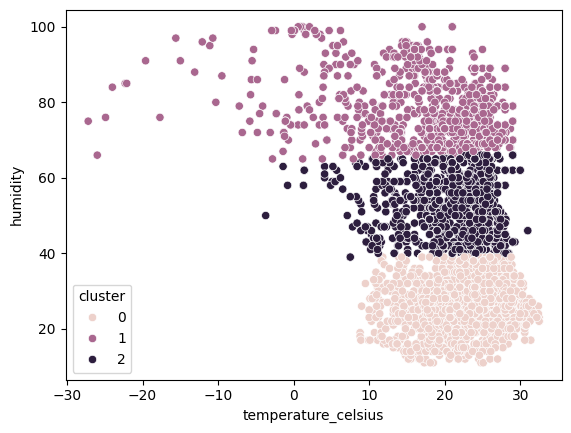

In [ ]:


from sklearn.cluster import KMeans
# Create a KMeans model with 3 clusters
model = KMeans(n_clusters=3)

# Fit the model to the data
model.fit(last_3_days_data_Weather[['temperature_celsius', 'humidity']])

# Get the cluster labels for each data point
clusters = model.labels_

# Add the cluster labels to the DataFrame
last_3_days_data_Weather['cluster'] = clusters

# Create a scatter plot of the data points colored by their cluster labels
sns.scatterplot(x='temperature_celsius', y='humidity', data=last_3_days_data_Weather, hue='cluster')


In [ ]:


# Group the data by date and calculate the mean temperature for each date
grouped_data = last_3_days_data_Weather.groupby('last_updated')['temperature_celsius'].mean().reset_index()

# Create a pie chart of the mean temperature for each date
fig = px.pie(grouped_data, values='temperature_celsius', names='last_updated', title='Temperature Variance Between Dates')

# Display the pie chart
fig.show()


In [ ]:


import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import folium
from folium.plugins import HeatMap
import phik
import warnings
warnings.filterwarnings('ignore')

# Create a dataframe with the data
df = pd.DataFrame({
    'latitude':last_3_days_data_Weather['latitude'],
    'longitude':last_3_days_data_Weather['longitude'],
    'Date': last_3_days_data_Weather['last_updated'],
    'Location': last_3_days_data_Weather['Ult_location'],
    'Temperature (°C)': last_3_days_data_Weather['temperature_celsius'],
    'Wind Speed (km/h)': last_3_days_data_Weather['wind_kph'],
    'Humidity (%)': last_3_days_data_Weather['humidity'],
    'Precipitation (mm)': last_3_days_data_Weather['precip_mm'],
    'Cluster': last_3_days_data_Weather['cluster']
})

# Create a heatmap of the temperature data
fig = px.density_mapbox(df, lat='latitude', lon='longitude', z='Temperature (°C)', radius=10,
                        center=dict(lat=last_3_days_data_Weather['latitude'].mean(), lon=last_3_days_data_Weather['longitude'].mean()),
                        zoom=4,
                        mapbox_style="carto-positron")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

# Create a scatter plot of the temperature vs humidity
fig = px.scatter(df, x='Temperature (°C)', y='Humidity (%)', color='Cluster',
                 title='Temperature vs Humidity')
fig.show()

# # Create a pie chart of the cluster distribution
# fig = px.pie(df, values='Cluster', names='Cluster', title='Cluster Distribution')
# fig.show()

# Create a bar chart of the mean temperature for each date
fig = px.bar(grouped_data, x='last_updated', y='temperature_celsius', title='Temperature Variance Between Dates')
fig.show()

# Create a table of the data
df



,latitude,longitude,Date,Location,Temperature (°C),Wind Speed (km/h),Humidity (%),Precipitation (mm),Cluster
0,24.57,77.72,2024-02-29 22:15:00,Ashoknagar-Madhya Pradesh @ 2024-02-29 22:15:00,22.5,12.6,29,0.0,0
1,23.33,77.80,2024-02-29 22:15:00,Raisen-Madhya Pradesh @ 2024-02-29 22:15:00,23.0,3.6,50,0.0,2
2,22.07,78.93,2024-02-29 22:15:00,Chhindwara-Madhya Pradesh @ 2024-02-29 22:15:00,23.0,7.6,34,0.0,0
3,21.86,77.93,2024-02-29 22:15:00,Betul-Madhya Pradesh @ 2024-02-29 22:15:00,25.6,5.0,25,0.0,0
4,22.75,77.72,2024-02-29 22:15:00,Hoshangabad-Madhya Pradesh @ 2024-02-29 22:15:00,23.0,3.6,50,0.0,2
...,...,...,...,...,...,...,...,...,...
3806,28.88,77.53,2024-03-06 22:45:00,Niwari-Uttar Pradesh @ 2024-03-06 22:45:00,18.0,6.1,49,0.0,2
3807,23.97,92.58,2024-03-06 22:45:00,Saitual-Mizoram @ 2024-03-06 22:45:00,11.0,4.0,44,0.0,2
3808,12.93,79.33,2024-03-06 22:45:00,Ranipet-Tamil Nadu @ 2024-03-06 22:45:00,23.8,7.2,67,0.0,1
3809,8.97,77.30,2024-03-06 22:45:00,Tenkasi-Tamil Nadu @ 2024-03-06 22:45:00,29.0,9.0,75,0.0,1


<Axes: title={'center': 'Temperature over Time for Each Cluster'}, xlabel='Date', ylabel='Temperature (°C)'>

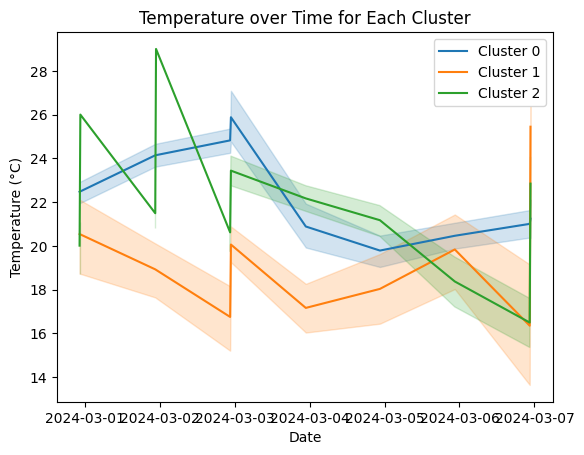

In [ ]:
# prompt: Using dataframe df: split the 3 clusters and make a graph with temperature

import seaborn as sns
import matplotlib.pyplot as plt

# Split the dataframe into 3 clusters
clusters = df.groupby('Cluster')

# Create a figure and axes
fig, ax = plt.subplots()

# Plot the temperature for each cluster
for cluster, data in clusters:
    sns.lineplot(data=data, x='Date', y='Temperature (\u00b0C)', label=f'Cluster {cluster}')

# Set the title and labels
ax.set_title('Temperature over Time for Each Cluster')
ax.set_xlabel('Date')
ax

<Axes: >

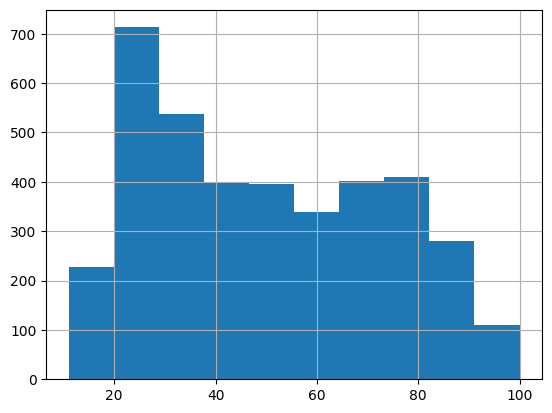

In [ ]:

# @title Distribution of Humidity

df['Humidity (%)'].hist()